In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All"
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/isic-2016/ISIC 2016/test_masks/ISIC_0010255.png
/kaggle/input/isic-2016/ISIC 2016/test_masks/ISIC_0011325.png
/kaggle/input/isic-2016/ISIC 2016/test_masks/ISIC_0000433.png
/kaggle/input/isic-2016/ISIC 2016/test_masks/ISIC_0001204.png
/kaggle/input/isic-2016/ISIC 2016/test_masks/ISIC_0010171.png
/kaggle/input/isic-2016/ISIC 2016/test_masks/ISIC_0009201.png
/kaggle/input/isic-2016/ISIC 2016/test_masks/ISIC_0009948.png
/kaggle/input/isic-2016/ISIC 2016/test_masks/ISIC_0009898.png
/kaggle/input/isic-2016/ISIC 2016/test_masks/ISIC_0011213.png
/kaggle/input/isic-2016/ISIC 2016/test_masks/ISIC_0011384.png
/kaggle/input/isic-2016/ISIC 2016/test_masks/ISIC_0000053.png
/kaggle/input/isic-2016/ISIC 2016/test_masks/ISIC_0000320.png
/kaggle/input/isic-2016/ISIC 2016/test_masks/ISIC_0002246.png
/kaggle/input/isic-2016/ISIC 2016/test_masks/ISIC_0003728.png
/kaggle/input/isic-2016/ISIC 2016/test_masks/ISIC_0004115.png
/kaggle/input/isic-2016/ISIC 2016/test_masks/ISIC_0009958.png
/kaggle/

Experiment One

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
from torchvision.models import mobilenet_v2
import torch
import torch.optim as optim
import torch.nn as nn
import torchvision.models as models
import torch.nn.functional as F


In [ ]:
train_img_dir = "/kaggle/input/isic-2016/ISIC 2016/train"
train_masks_dir = "/kaggle/input/isic-2016/ISIC 2016/train_masks"
image_files = os.listdir(train_img_dir)
mask_files = os.listdir(train_masks_dir)
print(f"There are {len(image_files)} image files in the directory.")

There are 3600 image files in the directory.


In [ ]:
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image
import os

class ISICDataset(Dataset):
    def __init__(self, image_dir, mask_dir, image_transform=None ,mask_transform=None):
        self.image_dir = image_dir
        self.mask_dir = mask_dir
        self.image_transform = image_transform
        self.mask_transform = mask_transform
        self.images = os.listdir(image_dir)

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_name = self.images[idx]


        if '_aug_' in img_name:

            mask_name = img_name.replace('image_', 'mask_')
        else:

            base_filename = img_name.split('.')[0]
            mask_name = f'ISIC_{base_filename.split("_")[-1]}.png'


        img_path = os.path.join(self.image_dir, img_name)
        mask_path = os.path.join(self.mask_dir, mask_name )


        image = Image.open(img_path).convert("RGB")
        mask = Image.open(mask_path).convert("L")

        if self.image_transform:
          image = self.image_transform(image)
        if self.mask_transform:
          mask = self.mask_transform(mask)

        return image, mask


In [ ]:
from sklearn.model_selection import train_test_split
import numpy as np


image_transform = transforms.Compose([
    transforms.Resize((128, 128)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

mask_transform = transforms.Compose([
    transforms.Resize((128, 128)),
    transforms.ToTensor(),
])



train_image_dir = "/kaggle/input/isic-2016/ISIC 2016/train"
train_mask_dir = "/kaggle/input/isic-2016/ISIC 2016/train_masks"
test_image_dir = '/kaggle/input/isic-2016/ISIC 2016/test'
test_mask_dir = '/kaggle/input/isic-2016/ISIC 2016/test_masks'


full_train_dataset = ISICDataset(train_image_dir, train_mask_dir, image_transform=image_transform,mask_transform=mask_transform)


train_indices, val_indices = train_test_split(
    np.arange(len(full_train_dataset)),
    test_size=0.2,
    random_state=42,
    shuffle=True
)


from torch.utils.data import SubsetRandomSampler

train_sampler = SubsetRandomSampler(train_indices)
val_sampler = SubsetRandomSampler(val_indices)

train_loader = DataLoader(full_train_dataset, batch_size=16, sampler=train_sampler)
val_loader = DataLoader(full_train_dataset, batch_size=16, sampler=val_sampler)


test_dataset = ISICDataset(test_image_dir, test_mask_dir, image_transform=image_transform,mask_transform=mask_transform)
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False)


In [ ]:
len(train_loader)*16 + len(val_loader)*16

3600

In [ ]:
class Decoder(nn.Module):
    def __init__(self):
        super(Decoder, self).__init__()

        self.up1 = self.upsample_block(1280, 512)
        self.refine1 = self.refinement_block(512, 512)

        self.up2 = self.upsample_block(512, 256)
        self.refine2 = self.refinement_block(256, 256)

        self.up3 = self.upsample_block(256, 128)
        self.refine3 = self.refinement_block(128, 128)

        self.up4 = self.upsample_block(128, 64)
        self.refine4 = self.refinement_block(64, 64)


        self.up5 = nn.Sequential(
            nn.ConvTranspose2d(64, 32, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(inplace=True)
        )
        self.final_conv = nn.Conv2d(32, 1, kernel_size=1)

    def upsample_block(self, in_channels, out_channels):
        return nn.Sequential(
            nn.ConvTranspose2d(in_channels, out_channels, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

    def refinement_block(self, in_channels, out_channels):
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        x = self.up1(x)
        x = self.refine1(x)
        x = self.up2(x)
        x = self.refine2(x)
        x = self.up3(x)
        x = self.refine3(x)
        x = self.up4(x)
        x = self.refine4(x)
        x = self.up5(x)
        x = self.final_conv(x)
        return x

In [ ]:
class SegNet(nn.Module):
    def __init__(self, encoder, decoder):
        super(SegNet, self).__init__()
        self.encoder = encoder
        self.decoder = decoder

    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x

# decoder = Decoder()
# segnet = SegNet(mobilenet_v2, decoder)


In [ ]:
def calc_iou(preds, labels):
    smooth = 1e-6
    preds_bool = torch.sigmoid(preds) > 0.5
    labels_bool = labels > 0.5


    intersection = (preds_bool & labels_bool).float().sum((1, 2))
    union = (preds_bool | labels_bool).float().sum((1, 2))

    iou = (intersection + smooth) / (union + smooth)
    return iou.mean()

def calc_dice(preds, labels):
    smooth = 1e-6
    preds = torch.sigmoid(preds) > 0.5
    labels_bool = labels > 0.5
    intersection = (preds & labels_bool).float().sum((1, 2))
    dice = (2. * intersection + smooth) / (preds.sum((1, 2)) + labels_bool.sum((1, 2)) + smooth)

    return dice.mean()


In [ ]:

mobilenet_v2 = models.mobilenet_v2(pretrained=True).features
for param in mobilenet_v2.parameters():
    param.requires_grad = False


decoder = Decoder()
segnet = SegNet(mobilenet_v2, decoder)


criterion = nn.BCEWithLogitsLoss()
optimizer = optim.RMSprop(filter(lambda p: p.requires_grad, segnet.parameters()), lr=0.001)


In [ ]:
import matplotlib.pyplot as plt

def visualize_prediction(image, ground_truth, prediction, epoch, num_epochs):

    if image.dim() == 4:
        image = image[0]
    if ground_truth.dim() == 4 or ground_truth.dim() == 3:
        ground_truth = ground_truth[0]
    if prediction.dim() == 4 or prediction.dim() == 3:
        prediction = prediction[0]

    image = image.cpu()
    ground_truth = ground_truth.cpu()
    prediction = prediction.cpu()


    ground_truth = ground_truth.squeeze()
    prediction = prediction.squeeze()
    prediction = prediction > 0.5


    if image.dim() == 3 and image.shape[0] == 3:
        image = image.permute(1, 2, 0)

    fig, axs = plt.subplots(1, 3, figsize=(15, 5))
    axs[0].imshow(image.numpy())
    axs[0].set_title('Input Image')
    axs[1].imshow(ground_truth.numpy(), cmap='gray')
    axs[1].set_title('Ground Truth')
    axs[2].imshow(prediction.numpy(), cmap='gray')
    axs[2].set_title('Model Prediction')
    plt.suptitle(f'Epoch {epoch+1}/{num_epochs}')
    plt.show()


In [ ]:
import matplotlib.pyplot as plt
import torch

def train_and_validate(model, criterion, optimizer, train_dataloader, val_dataloader, num_epochs=15):
    train_losses, val_losses, avg_ious, avg_dices = [], [], [], []

    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        for images, masks in train_dataloader:
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, masks)
            loss.backward()
            optimizer.step()
            running_loss += loss.item()
        train_loss = running_loss / len(train_dataloader)
        train_losses.append(train_loss)

        model.eval()
        val_running_loss, iou_scores, dice_scores = 0.0, [], []
        with torch.no_grad():
            for images, masks in val_dataloader:
                outputs = model(images)
                loss = criterion(outputs, masks)
                val_running_loss += loss.item()


                iou_scores.append(calc_iou(outputs, masks))
                dice_scores.append(calc_dice(outputs, masks))

        val_loss = val_running_loss / len(val_dataloader)
        val_losses.append(val_loss)

        avg_iou = torch.tensor(iou_scores).mean().item()
        avg_dice = torch.tensor(dice_scores).mean().item()
        avg_ious.append(avg_iou)
        avg_dices.append(avg_dice)

        print(f'Epoch {epoch+1}/{num_epochs}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, Avg IoU: {avg_iou:.4f}, Avg Dice: {avg_dice:.4f}')
        visualize_prediction(images.cpu(), masks.cpu(), outputs.cpu(), epoch, num_epochs)


    plt.figure(figsize=(12, 6))


    plt.subplot(1, 2, 1)
    plt.plot(train_losses, label='Training Loss')
    plt.plot(val_losses, label='Validation Loss')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()


    plt.subplot(1, 2, 2)
    plt.plot(avg_ious, label='Average IoU')
    plt.plot(avg_dices, label='Average Dice')
    plt.title('IoU and Dice Scores')
    plt.xlabel('Epoch')
    plt.ylabel('Score')
    plt.legend()

    plt.tight_layout()
    plt.show()


Epoch 1/10, Train Loss: 0.3333, Val Loss: 0.3115, Avg IoU: 0.7167, Avg Dice: 0.7681


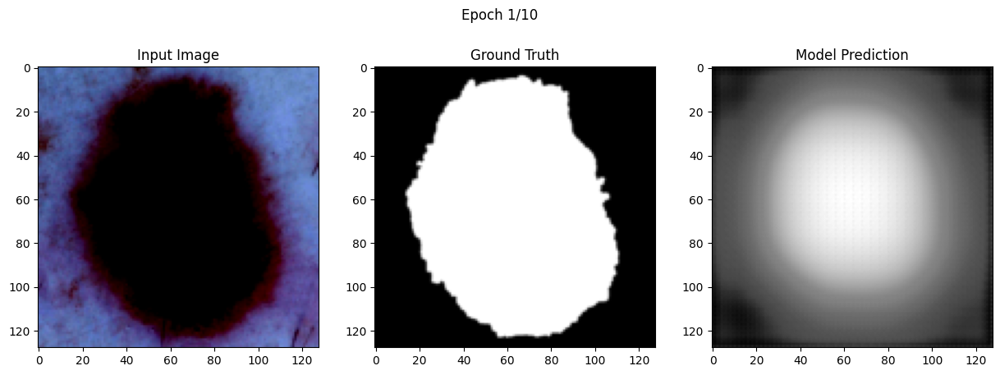

Epoch 2/10, Train Loss: 0.2648, Val Loss: 0.2685, Avg IoU: 0.7336, Avg Dice: 0.7759


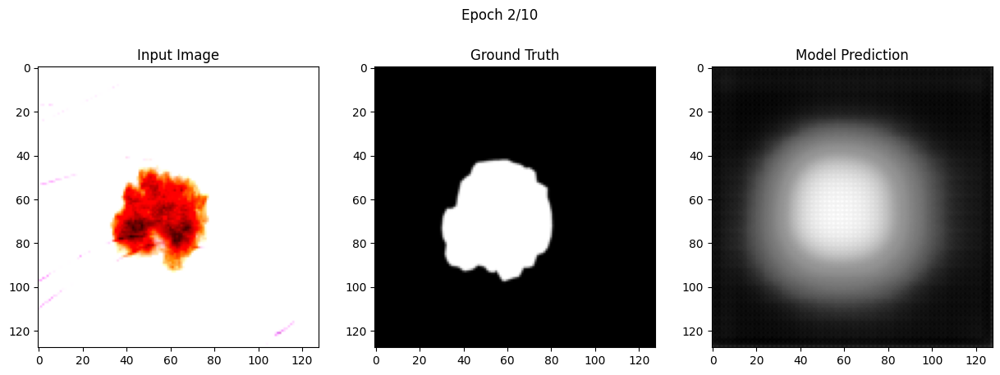

Epoch 3/10, Train Loss: 0.2539, Val Loss: 0.2576, Avg IoU: 0.7560, Avg Dice: 0.8005


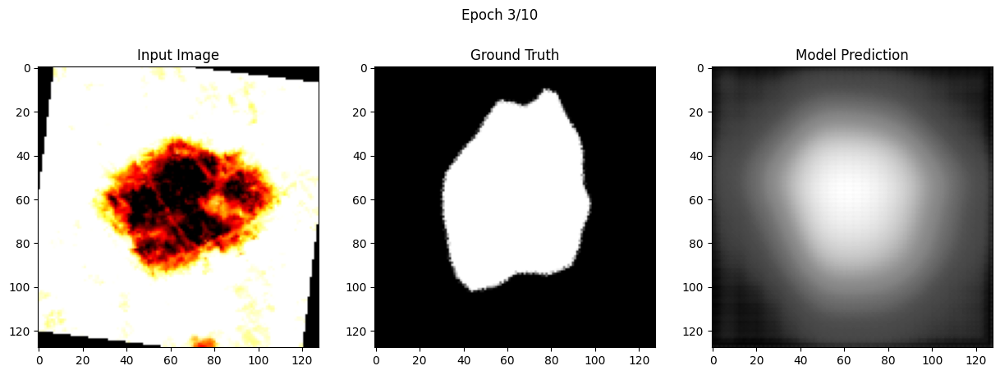

Epoch 4/10, Train Loss: 0.2382, Val Loss: 0.2371, Avg IoU: 0.7508, Avg Dice: 0.7937


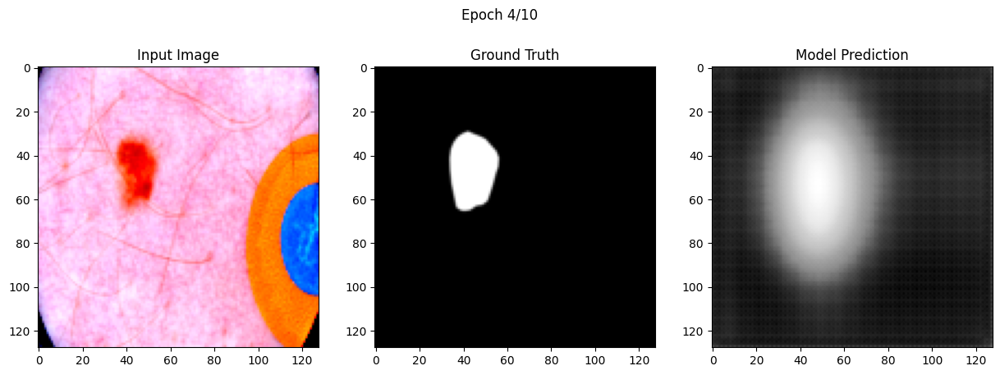

Epoch 5/10, Train Loss: 0.2246, Val Loss: 0.2281, Avg IoU: 0.7654, Avg Dice: 0.8091


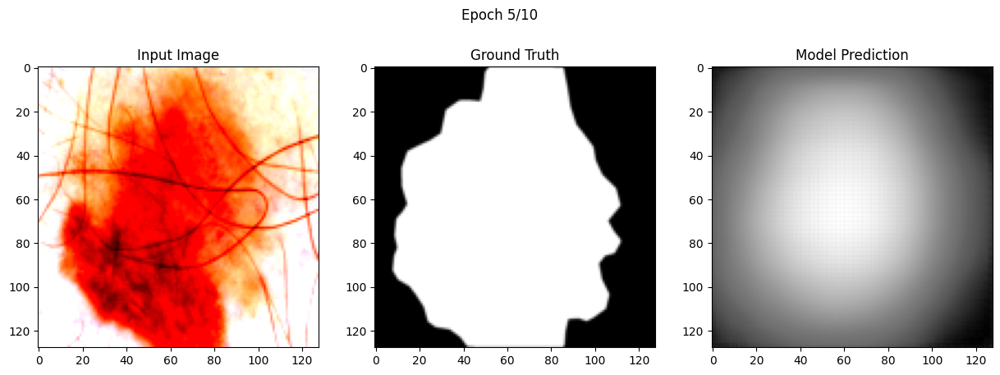

Epoch 6/10, Train Loss: 0.2182, Val Loss: 0.2287, Avg IoU: 0.7532, Avg Dice: 0.7941


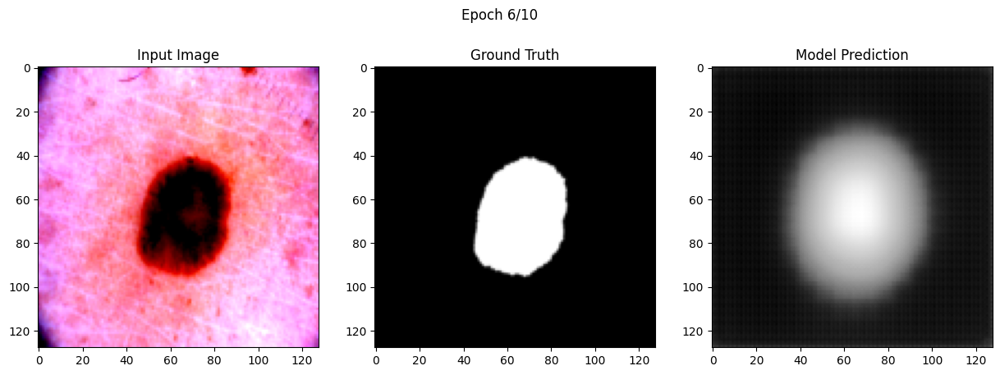

Epoch 7/10, Train Loss: 0.2064, Val Loss: 0.2431, Avg IoU: 0.7430, Avg Dice: 0.7846


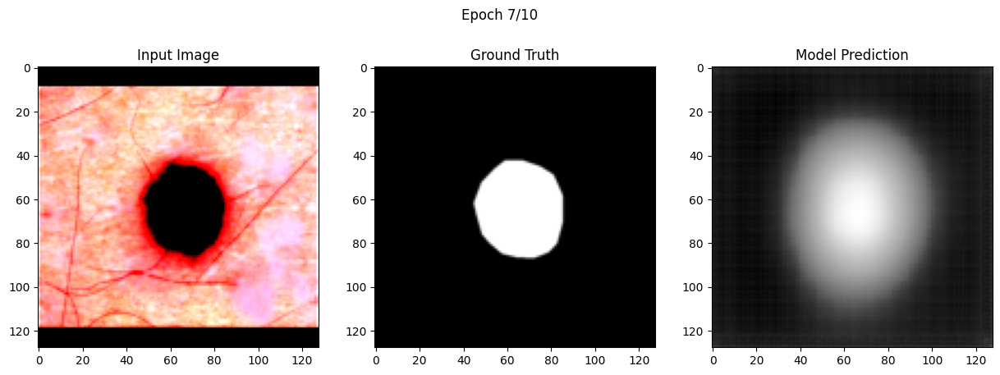

Epoch 8/10, Train Loss: 0.2010, Val Loss: 0.2306, Avg IoU: 0.7763, Avg Dice: 0.8205


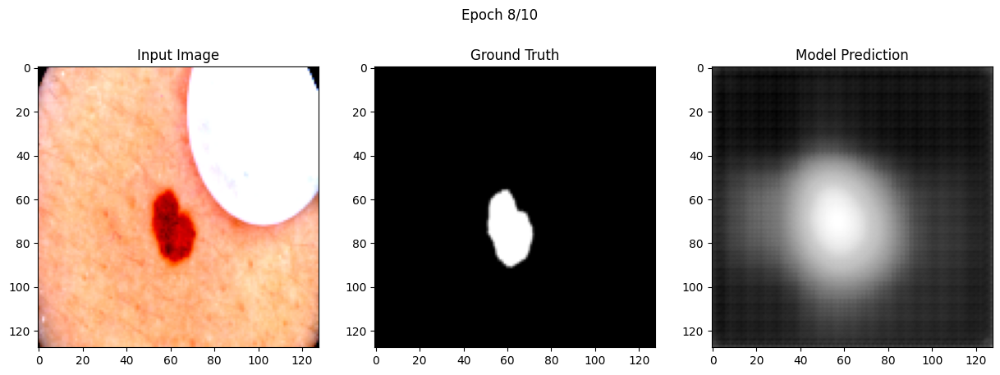

Epoch 9/10, Train Loss: 0.1947, Val Loss: 0.2296, Avg IoU: 0.7781, Avg Dice: 0.8218


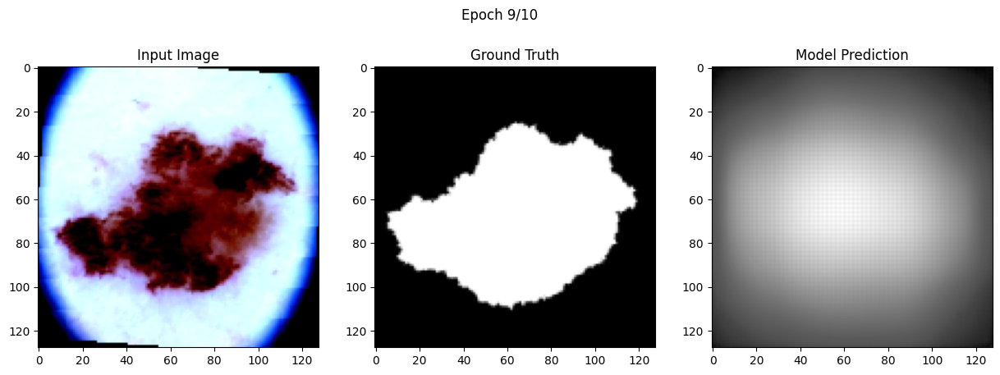

Epoch 10/10, Train Loss: 0.1912, Val Loss: 0.2207, Avg IoU: 0.7774, Avg Dice: 0.8195


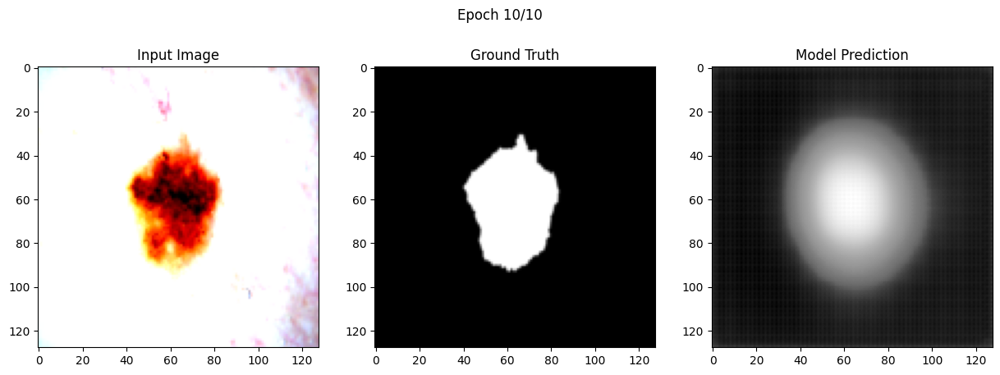

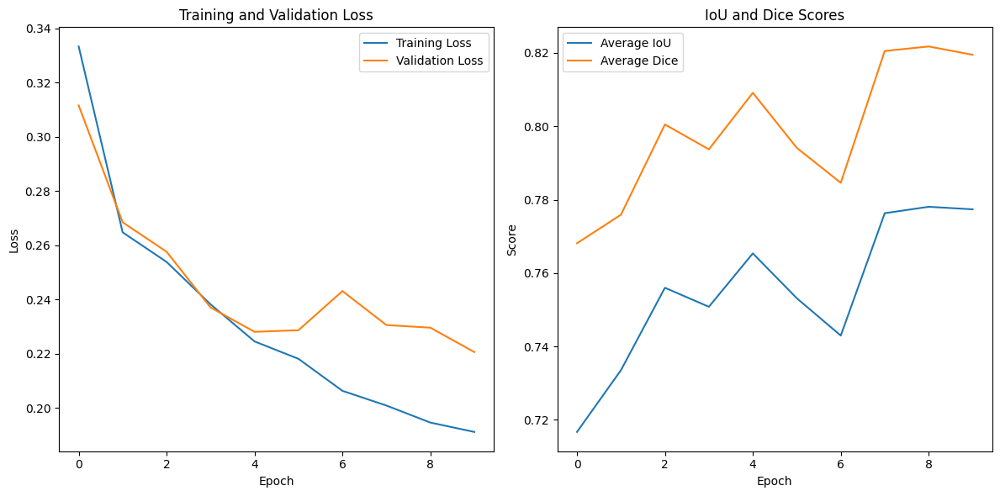

In [ ]:
train_and_validate(segnet, criterion, optimizer, train_loader,val_loader, num_epochs=10)

In [ ]:
import matplotlib.pyplot as plt

def visualize_test_prediction(image, ground_truth, prediction):

    if image.dim() == 4:
        image = image[0]
    if ground_truth.dim() == 4 or ground_truth.dim() == 3:
        ground_truth = ground_truth[0]
    if prediction.dim() == 4 or prediction.dim() == 3:
        prediction = prediction[0]


    image = image.cpu()
    ground_truth = ground_truth.cpu()
    prediction = prediction.cpu()


    ground_truth = ground_truth.squeeze()
    prediction = prediction.squeeze()
    prediction= prediction > 0.5


    if image.dim() == 3 and image.shape[0] == 3:
        image = image.permute(1, 2, 0)

    fig, axs = plt.subplots(1, 3, figsize=(15, 5))
    axs[0].imshow(image.numpy())
    axs[0].set_title('Input Image')
    axs[1].imshow(ground_truth.numpy(), cmap='gray')
    axs[1].set_title('Ground Truth')
    axs[2].imshow(prediction.numpy(), cmap='gray')
    axs[2].set_title('Model Prediction')
    plt.suptitle(f'Test Prediction')
    plt.show()


In [ ]:
def test_model(model, criterion, test_dataloader):
    model.eval()
    test_loss = 0.0
    iou_scores, dice_scores = [], []

    with torch.no_grad():
        for images, masks in test_dataloader:
            outputs = model(images)
            loss = criterion(outputs, masks)
            test_loss += loss.item()


            iou_scores.append(calc_iou(outputs, masks))
            dice_scores.append(calc_dice(outputs, masks))


            if len(iou_scores) <= 1:
                visualize_test_prediction(images.cpu(), masks.cpu(), outputs.cpu())

    test_loss /= len(test_dataloader)
    avg_iou = torch.tensor(iou_scores).mean().item()
    avg_dice = torch.tensor(dice_scores).mean().item()

    print(f'Test Loss: {test_loss:.4f}, Avg IoU: {avg_iou:.4f}, Avg Dice: {avg_dice:.4f}')





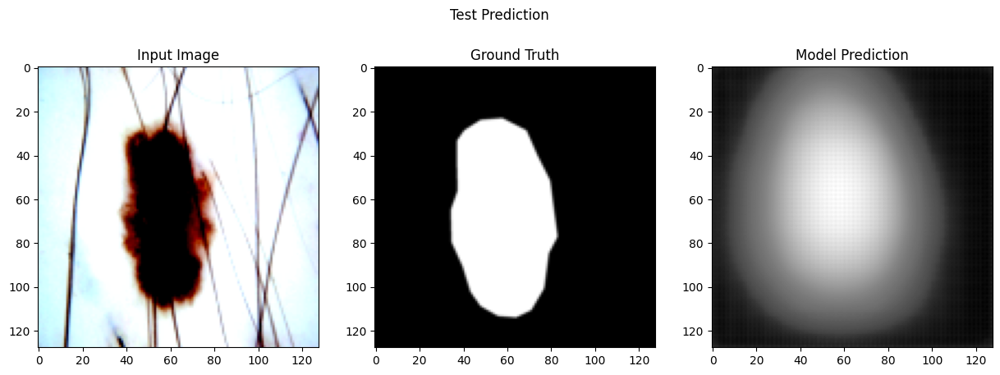

Test Loss: 0.2638, Avg IoU: 0.7585, Avg Dice: 0.8025


In [ ]:

test_model(segnet, criterion, test_loader)

Loss : IOU Optimizer : adam

In [ ]:
import torch

class IoULoss(nn.Module):
    def __init__(self, smooth=1e-6):
        super(IoULoss, self).__init__()
        self.smooth = smooth

    def forward(self, outputs, targets):

        outputs = torch.sigmoid(outputs)


        outputs_flat = outputs.view(-1)
        targets_flat = targets.view(-1)


        intersection = (outputs_flat * targets_flat).sum()
        total = (outputs_flat + targets_flat).sum()
        union = total - intersection

        IoU = (intersection + self.smooth) / (union + self.smooth)

        return 1 - IoU


Epoch 1/15, Train Loss: 0.2398, Val Loss: 0.2617, Avg IoU: 0.7958, Avg Dice: 0.8361


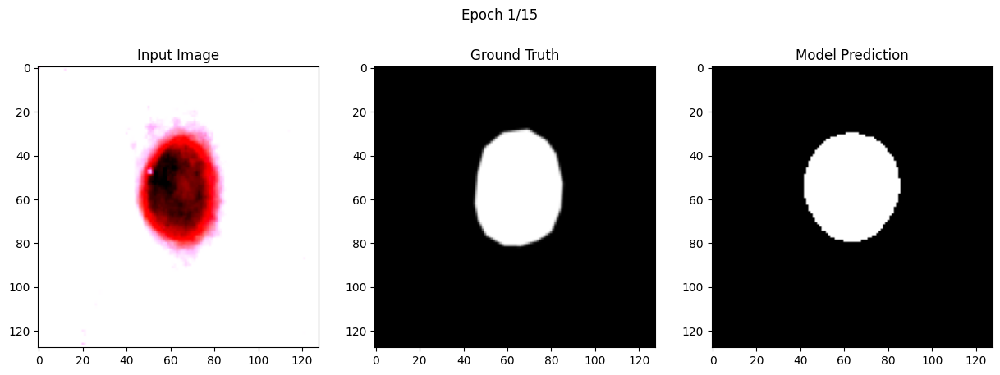

Epoch 2/15, Train Loss: 0.2392, Val Loss: 0.2642, Avg IoU: 0.7970, Avg Dice: 0.8358


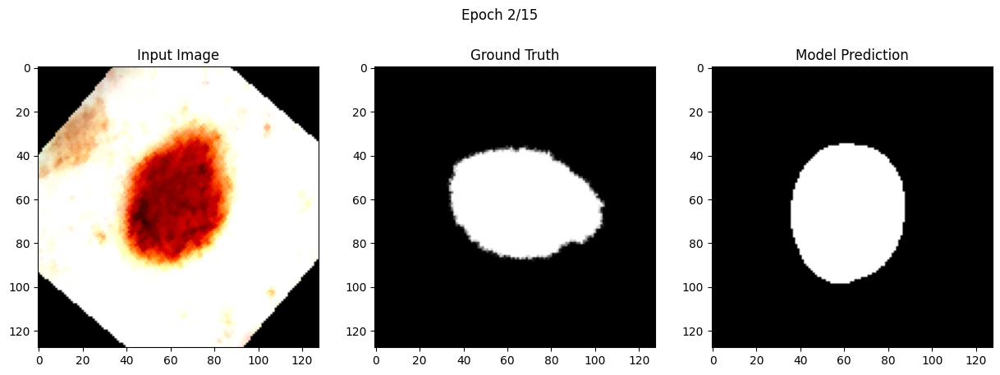

Epoch 3/15, Train Loss: 0.2298, Val Loss: 0.2584, Avg IoU: 0.7983, Avg Dice: 0.8375


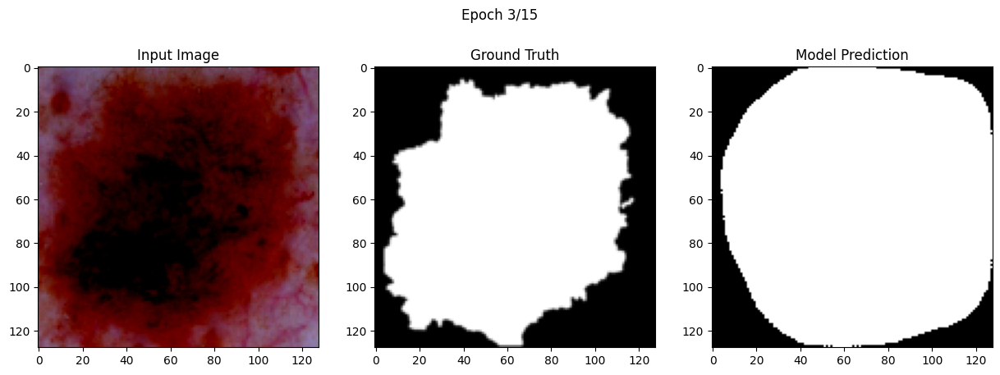

Epoch 4/15, Train Loss: 0.2291, Val Loss: 0.2546, Avg IoU: 0.7969, Avg Dice: 0.8368


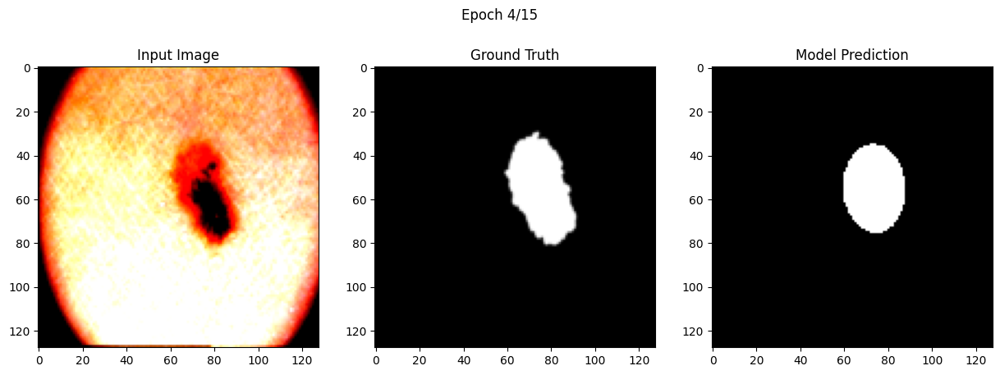

Epoch 5/15, Train Loss: 0.2316, Val Loss: 0.2586, Avg IoU: 0.7982, Avg Dice: 0.8367


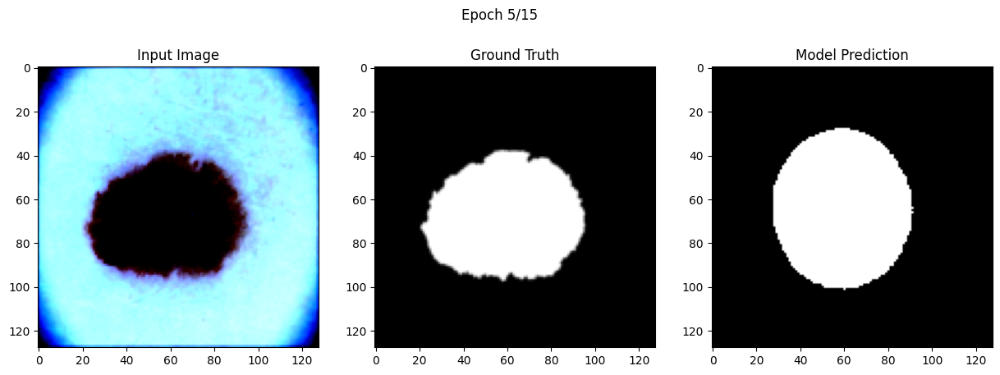

Epoch 6/15, Train Loss: 0.2246, Val Loss: 0.2567, Avg IoU: 0.7997, Avg Dice: 0.8386


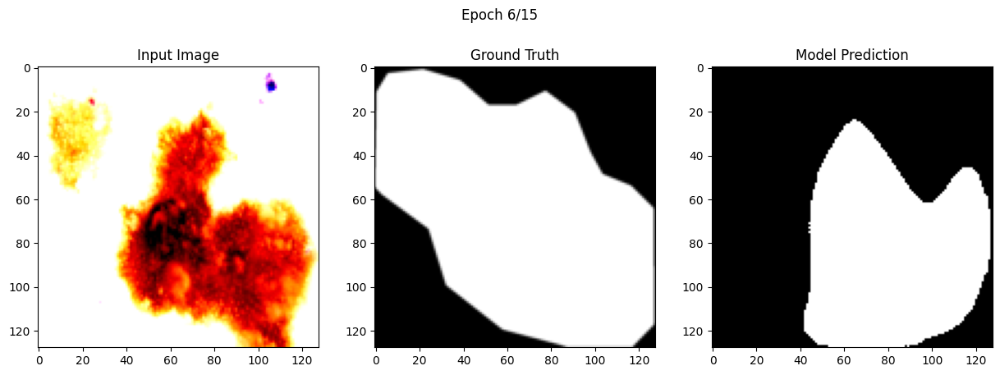

Epoch 7/15, Train Loss: 0.2213, Val Loss: 0.2579, Avg IoU: 0.7969, Avg Dice: 0.8359


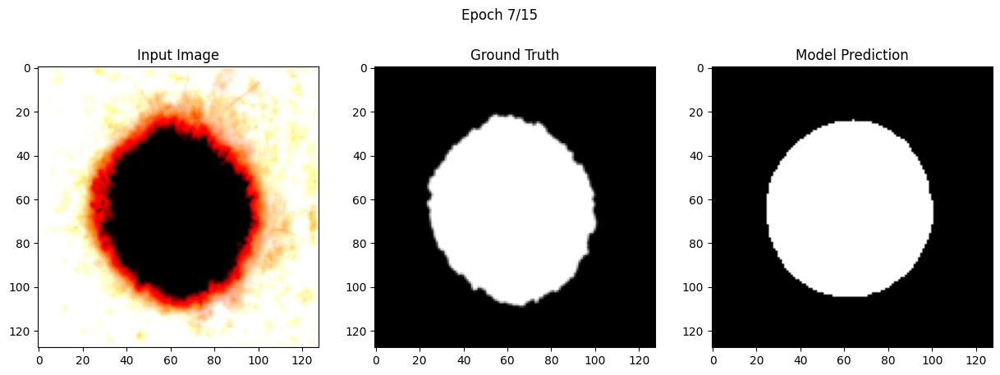

Epoch 8/15, Train Loss: 0.2118, Val Loss: 0.2549, Avg IoU: 0.8006, Avg Dice: 0.8394


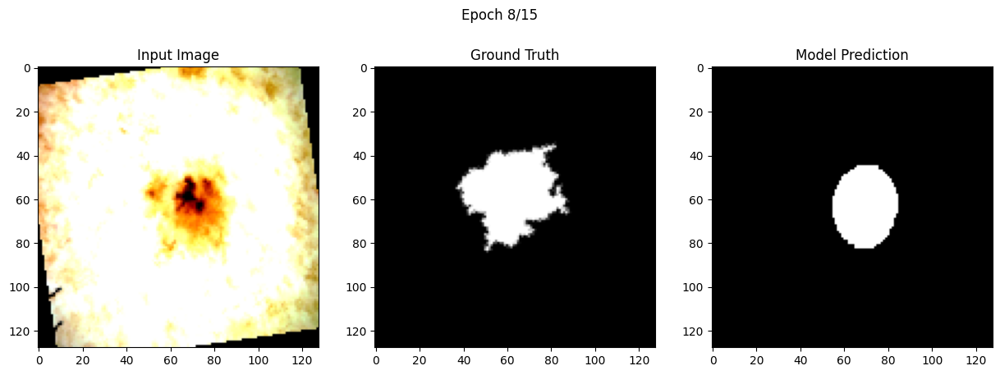

Epoch 9/15, Train Loss: 0.2154, Val Loss: 0.2547, Avg IoU: 0.7996, Avg Dice: 0.8385


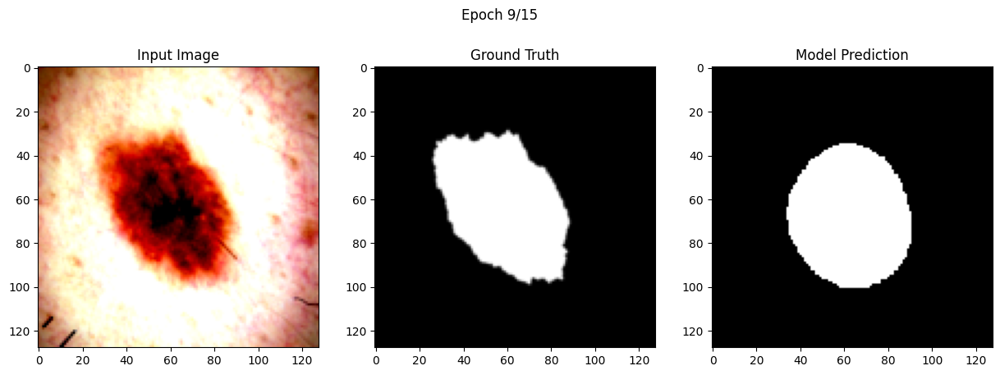

Epoch 10/15, Train Loss: 0.2103, Val Loss: 0.2512, Avg IoU: 0.8001, Avg Dice: 0.8394


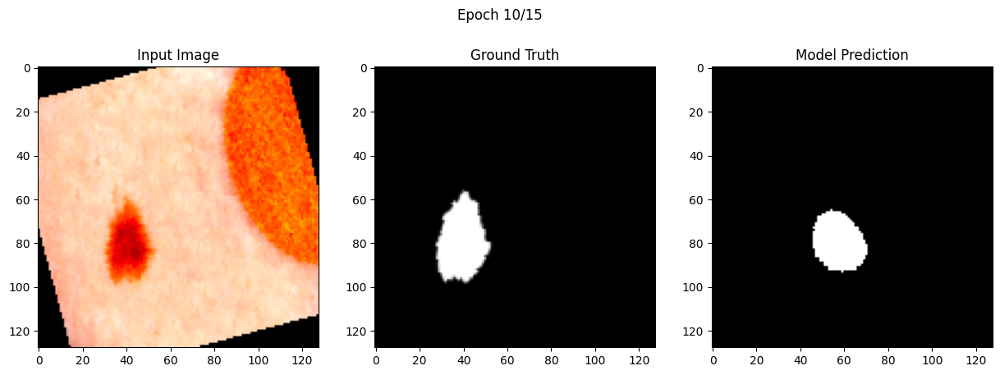

Epoch 11/15, Train Loss: 0.2045, Val Loss: 0.2482, Avg IoU: 0.8019, Avg Dice: 0.8408


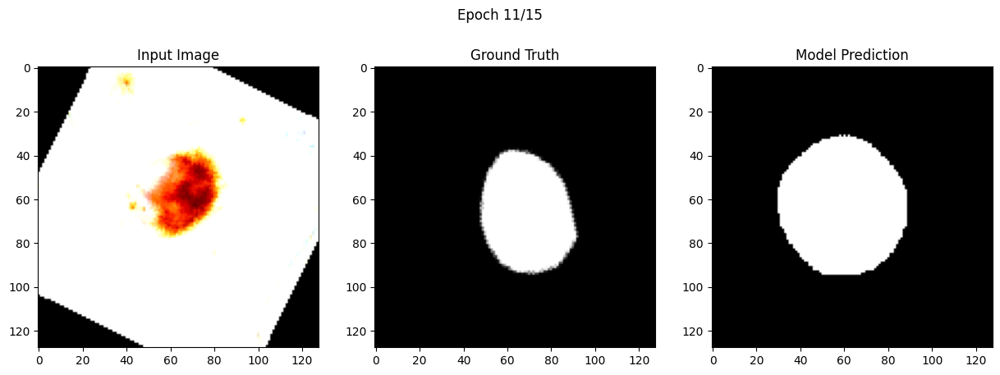

Epoch 12/15, Train Loss: 0.2035, Val Loss: 0.2485, Avg IoU: 0.8030, Avg Dice: 0.8419


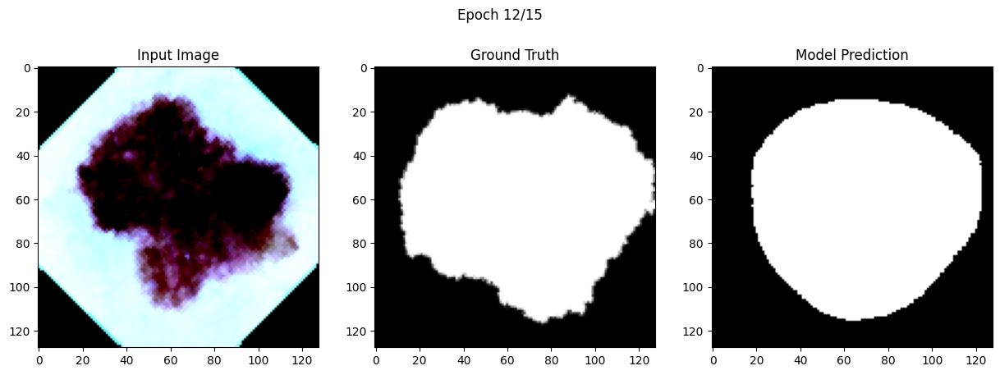

Epoch 13/15, Train Loss: 0.2000, Val Loss: 0.2566, Avg IoU: 0.7992, Avg Dice: 0.8380


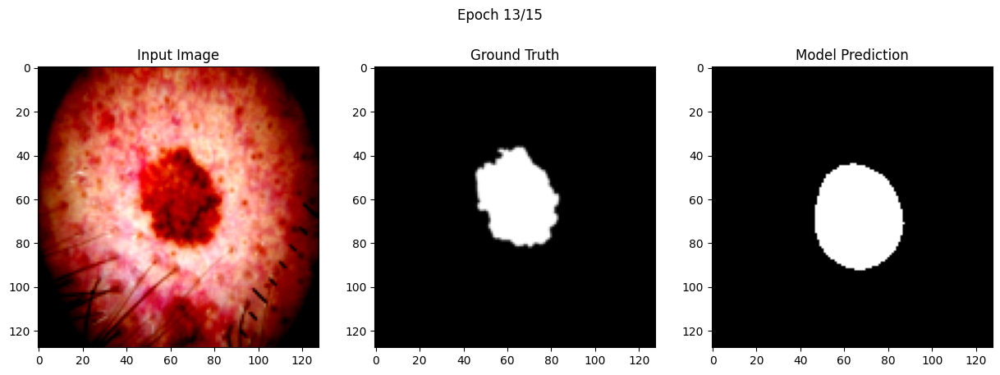

Epoch 14/15, Train Loss: 0.1962, Val Loss: 0.2510, Avg IoU: 0.8012, Avg Dice: 0.8400


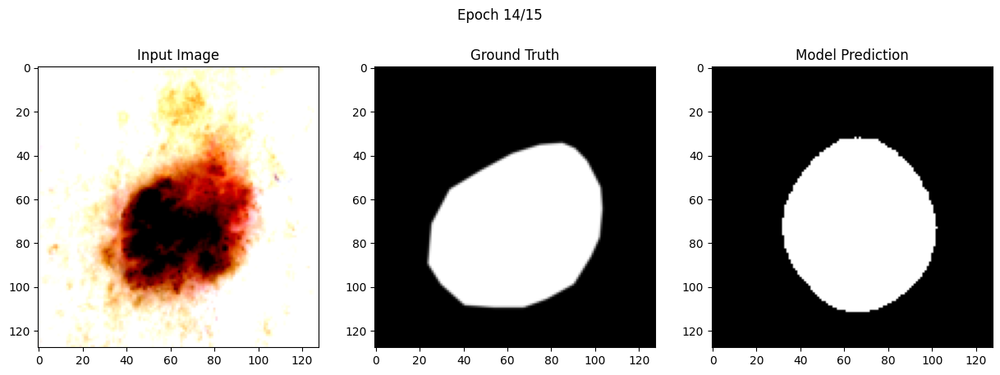

Epoch 15/15, Train Loss: 0.1988, Val Loss: 0.2527, Avg IoU: 0.8019, Avg Dice: 0.8404


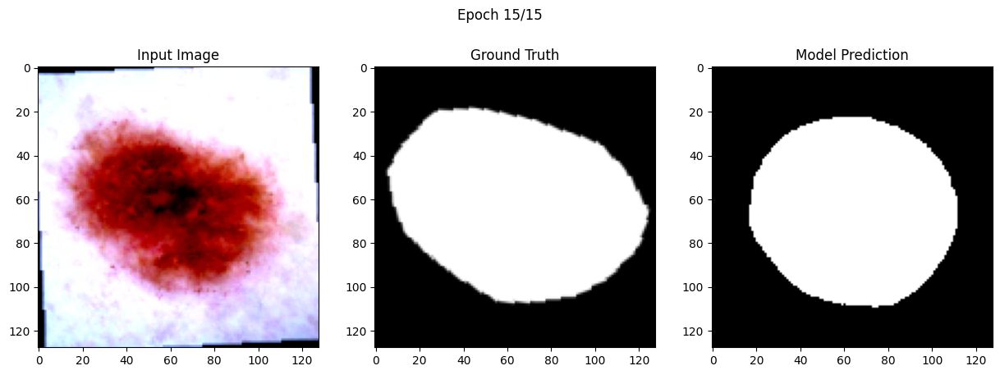

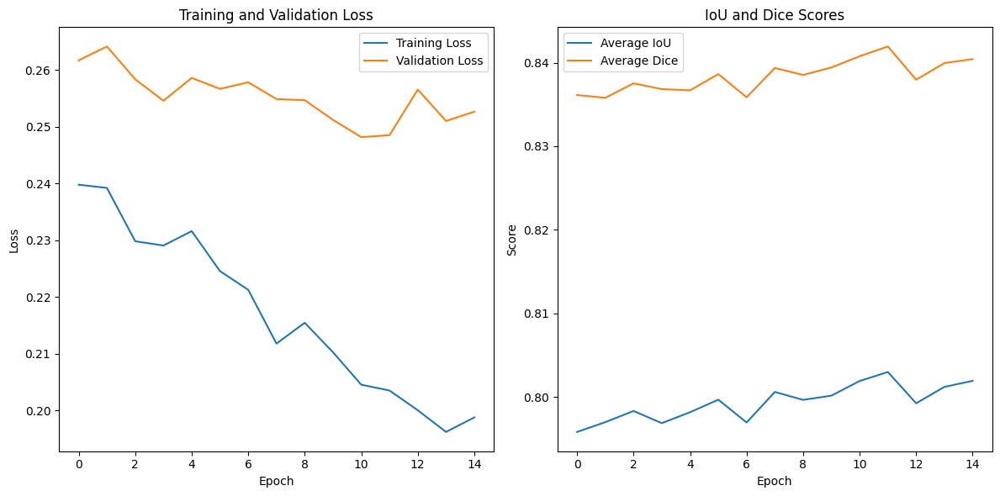

In [ ]:
segnet_2 = SegNet(mobilenet_v2, decoder)

criterion_2 = IoULoss()
optimizer_2 = optim.Adam(filter(lambda p: p.requires_grad, segnet.parameters()), lr=0.0001)

train_and_validate(segnet_2, criterion_2, optimizer_2, train_loader,val_loader, num_epochs=15)

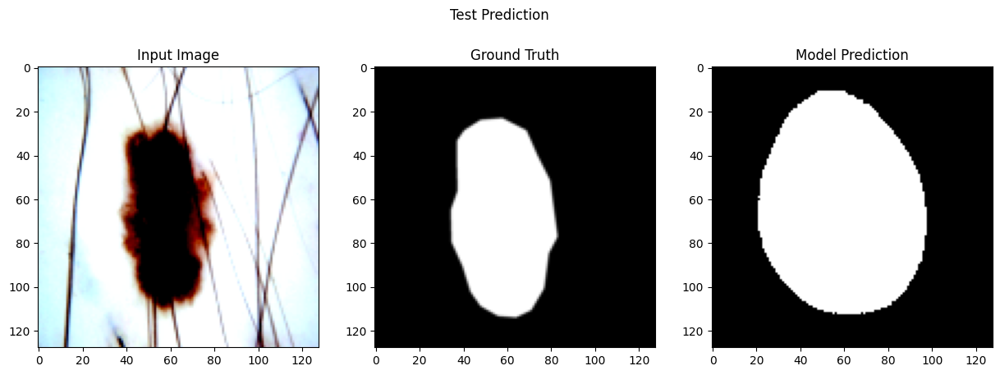

Test Loss: 0.3144, Avg IoU: 0.7724, Avg Dice: 0.8154


In [ ]:
test_model(segnet_2, criterion_2, test_loader)

Experiment 2

Epoch 1/15, Train Loss: 0.1607, Val Loss: 0.1987, Avg IoU: 0.7922, Avg Dice: 0.8332


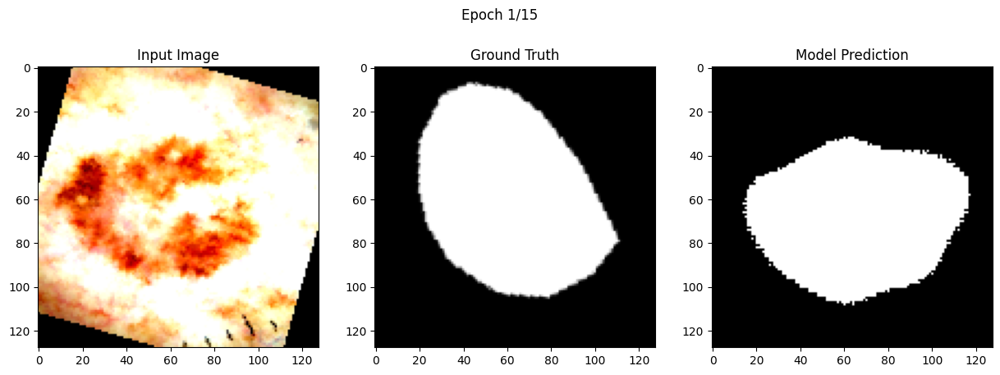

Epoch 2/15, Train Loss: 0.1573, Val Loss: 0.1952, Avg IoU: 0.7937, Avg Dice: 0.8338


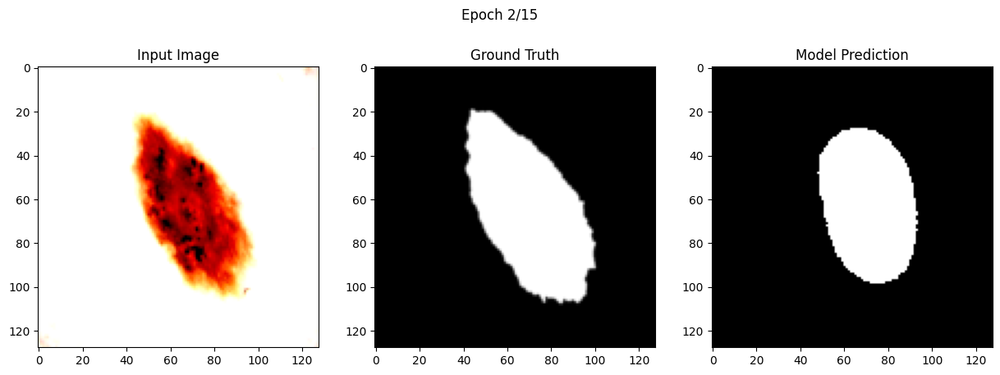

Epoch 3/15, Train Loss: 0.1553, Val Loss: 0.1974, Avg IoU: 0.7972, Avg Dice: 0.8375


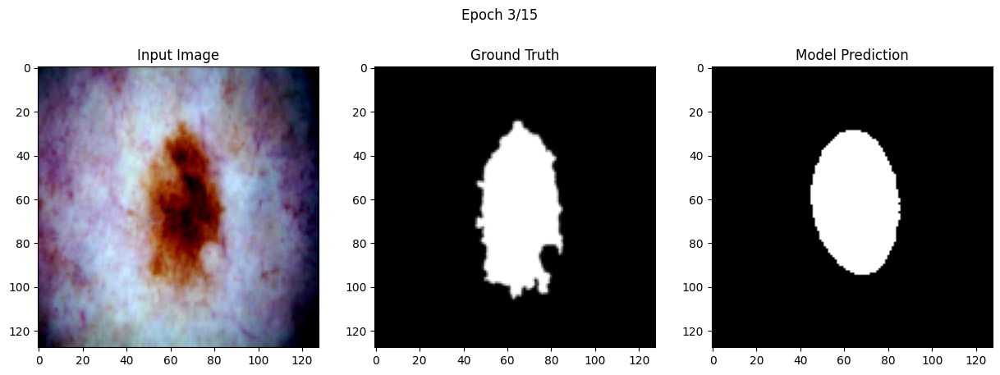

Epoch 4/15, Train Loss: 0.1498, Val Loss: 0.2101, Avg IoU: 0.7933, Avg Dice: 0.8341


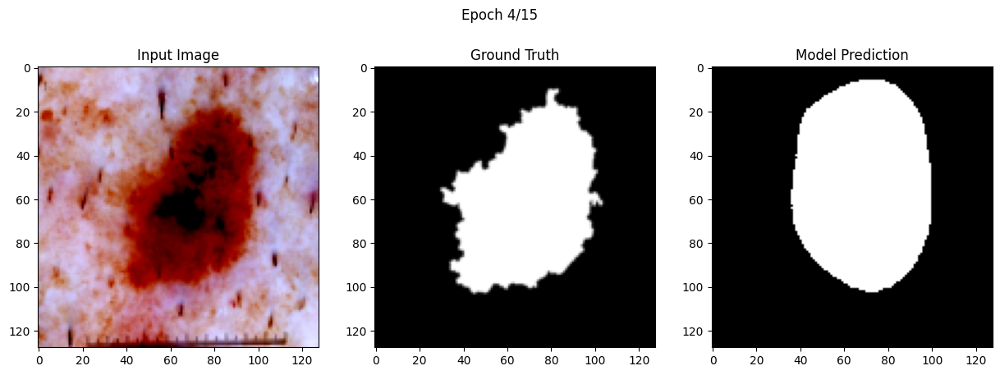

Epoch 5/15, Train Loss: 0.1471, Val Loss: 0.2057, Avg IoU: 0.7867, Avg Dice: 0.8248


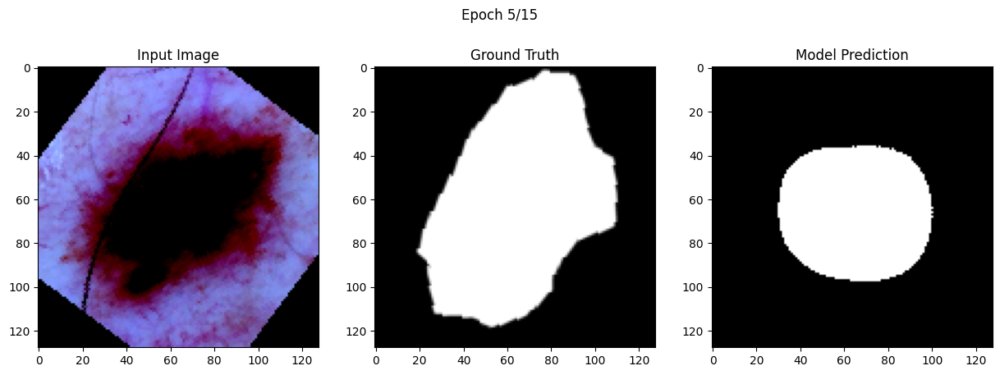

Epoch 6/15, Train Loss: 0.1465, Val Loss: 0.1968, Avg IoU: 0.7967, Avg Dice: 0.8348


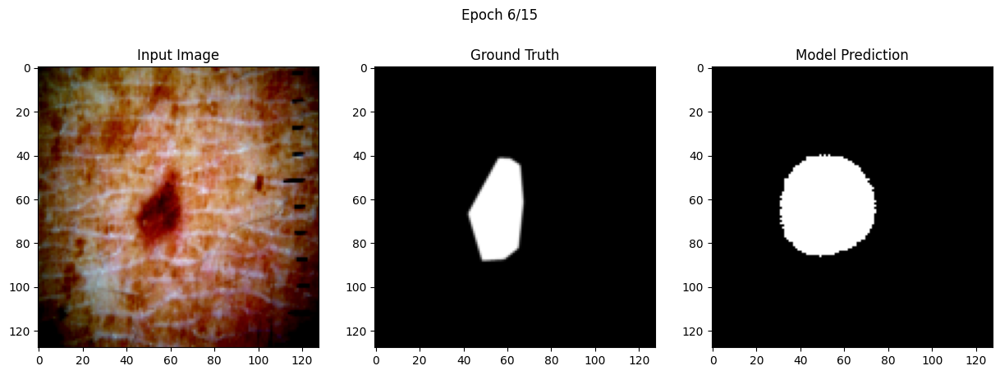

Epoch 7/15, Train Loss: 0.1436, Val Loss: 0.1990, Avg IoU: 0.7947, Avg Dice: 0.8327


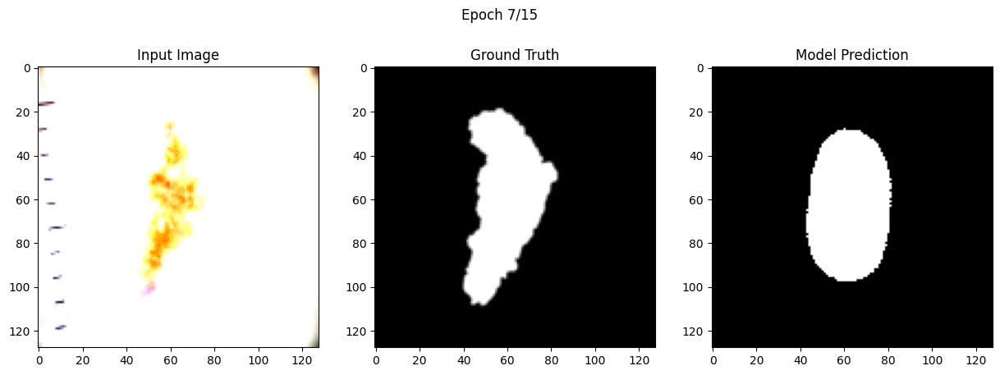

Epoch 8/15, Train Loss: 0.1409, Val Loss: 0.2117, Avg IoU: 0.7904, Avg Dice: 0.8324


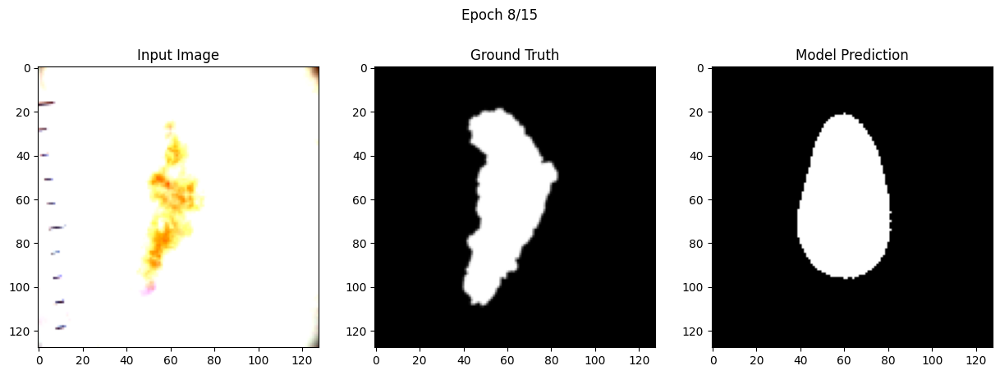

Epoch 9/15, Train Loss: 0.1391, Val Loss: 0.2068, Avg IoU: 0.7953, Avg Dice: 0.8336


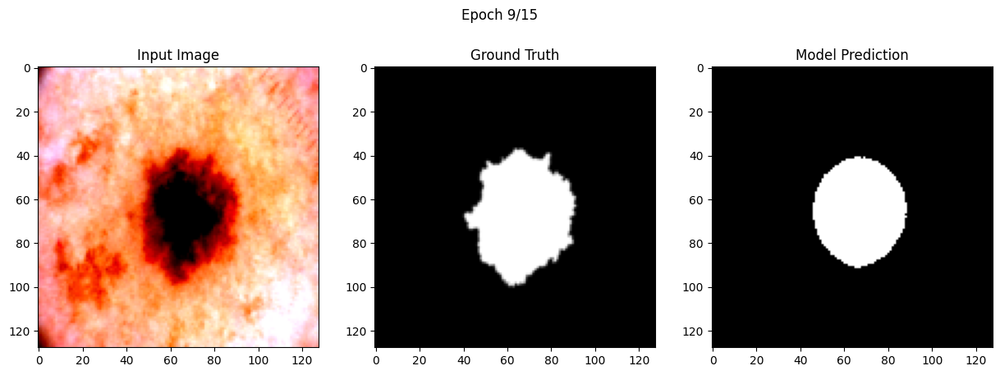

Epoch 10/15, Train Loss: 0.1319, Val Loss: 0.1999, Avg IoU: 0.8012, Avg Dice: 0.8401


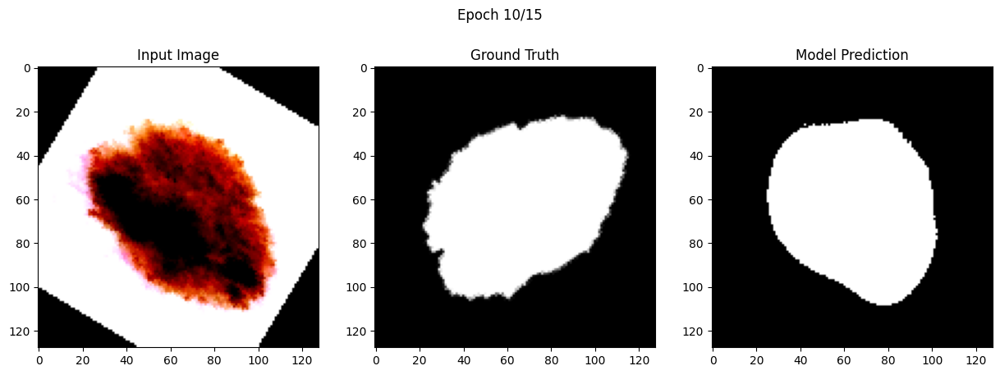

Epoch 11/15, Train Loss: 0.1245, Val Loss: 0.1992, Avg IoU: 0.8053, Avg Dice: 0.8440


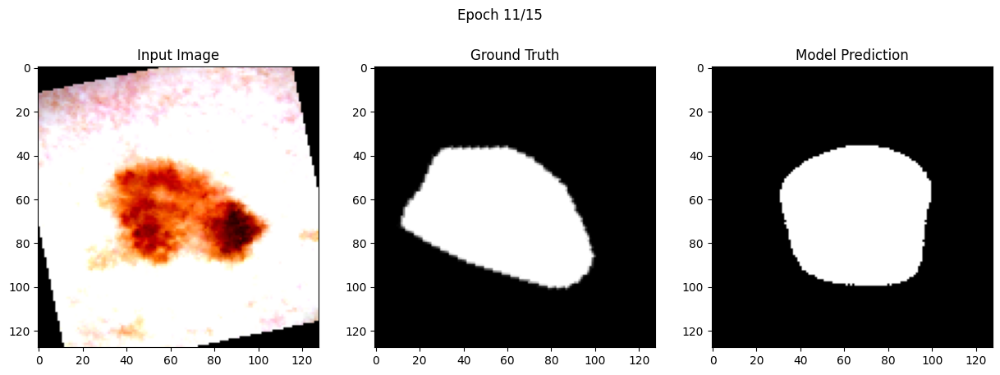

Epoch 12/15, Train Loss: 0.1265, Val Loss: 0.2004, Avg IoU: 0.8024, Avg Dice: 0.8398


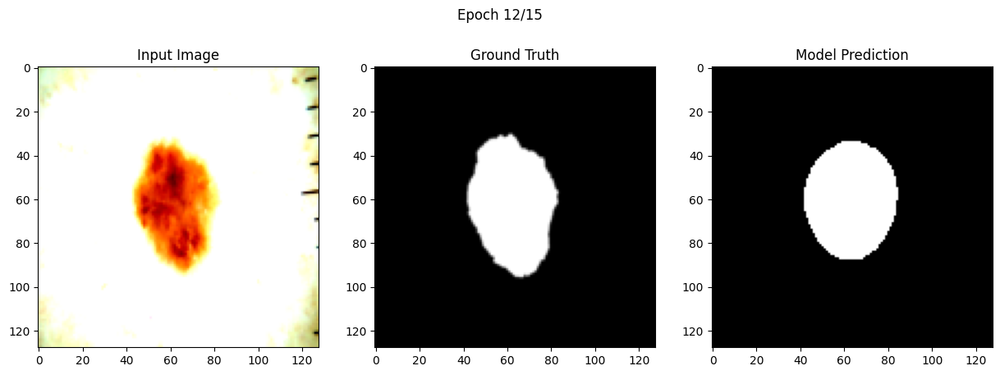

Epoch 13/15, Train Loss: 0.1253, Val Loss: 0.1982, Avg IoU: 0.7992, Avg Dice: 0.8398


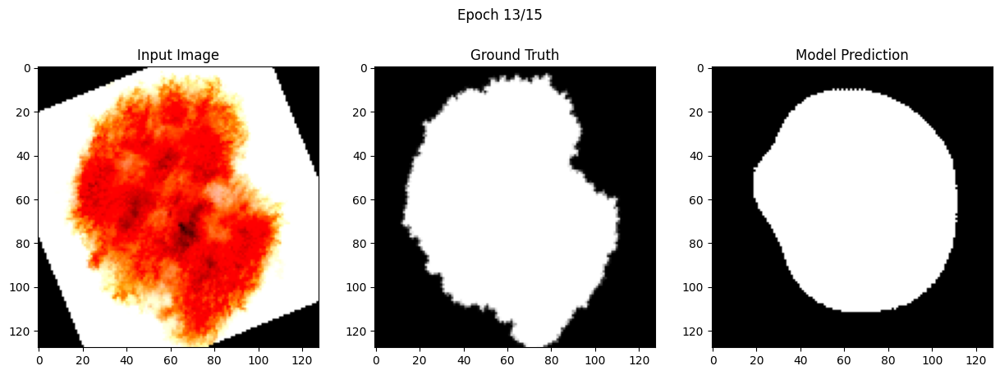

Epoch 14/15, Train Loss: 0.1207, Val Loss: 0.1917, Avg IoU: 0.8017, Avg Dice: 0.8407


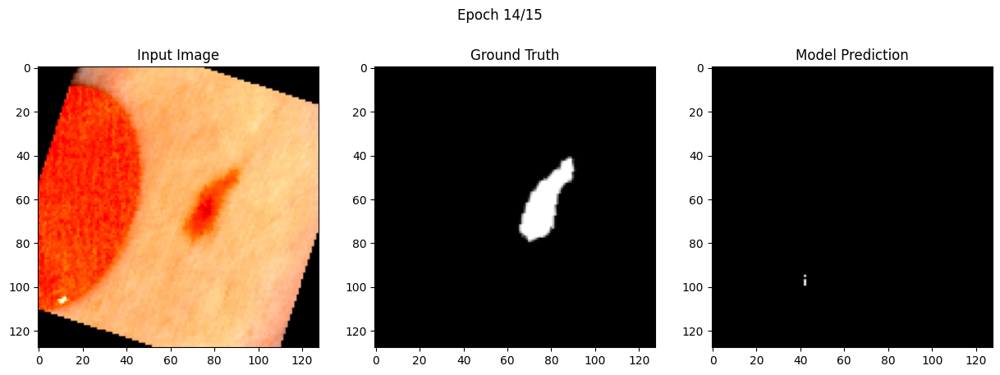

Epoch 15/15, Train Loss: 0.1212, Val Loss: 0.2058, Avg IoU: 0.8026, Avg Dice: 0.8409


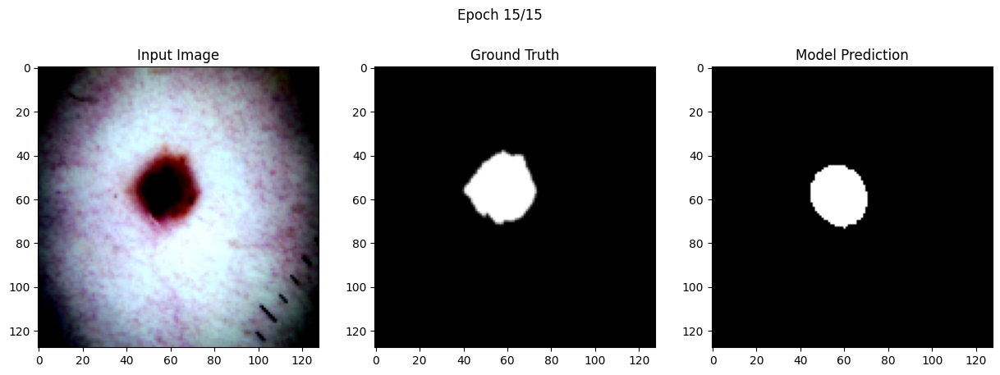

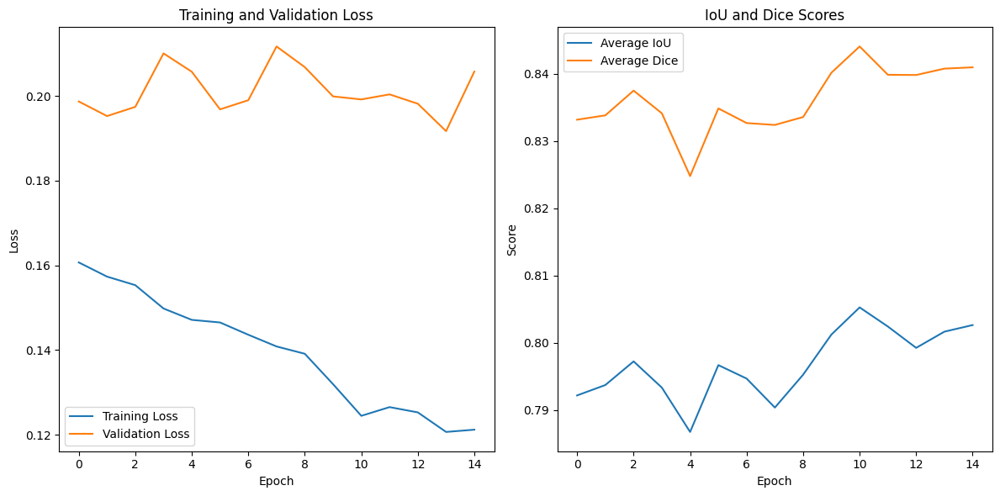

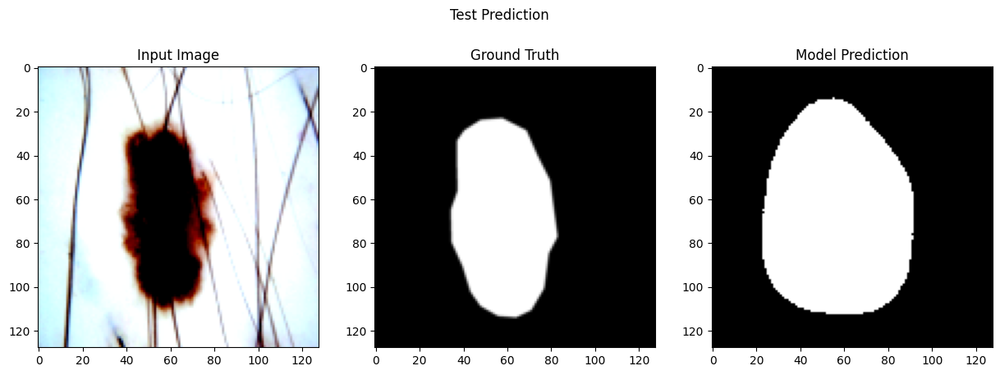

Test Loss: 0.2660, Avg IoU: 0.7659, Avg Dice: 0.8094


In [ ]:
mobilenet_v2_new = models.mobilenet_v2(pretrained=True).features
for param in mobilenet_v2_new.parameters():
    param.requires_grad = True


segnet_3 = SegNet(mobilenet_v2_new, decoder)


optimizer_3 = optim.Adam(segnet.parameters(), lr=0.001)


train_and_validate(segnet_3, criterion, optimizer_3, train_loader, val_loader, num_epochs=15)


test_model(segnet_3, criterion, test_loader)

Epoch 1/15, Train Loss: 0.3160, Val Loss: 0.3079, Avg IoU: 0.7542, Avg Dice: 0.8002


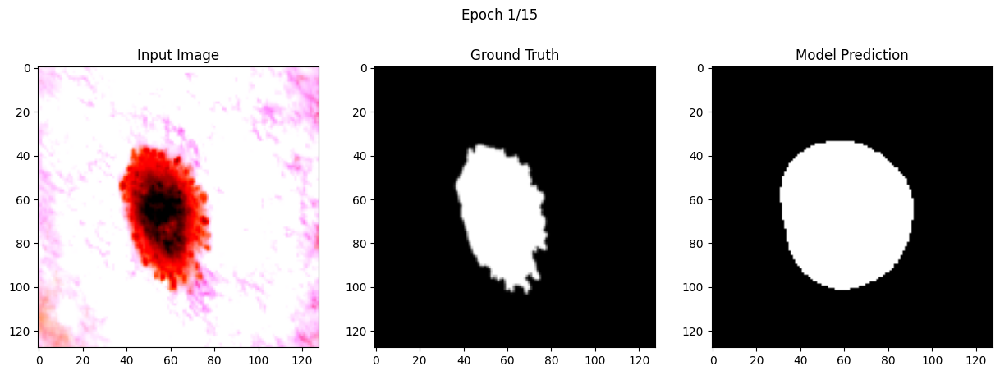

Epoch 2/15, Train Loss: 0.2892, Val Loss: 0.2942, Avg IoU: 0.7735, Avg Dice: 0.8151


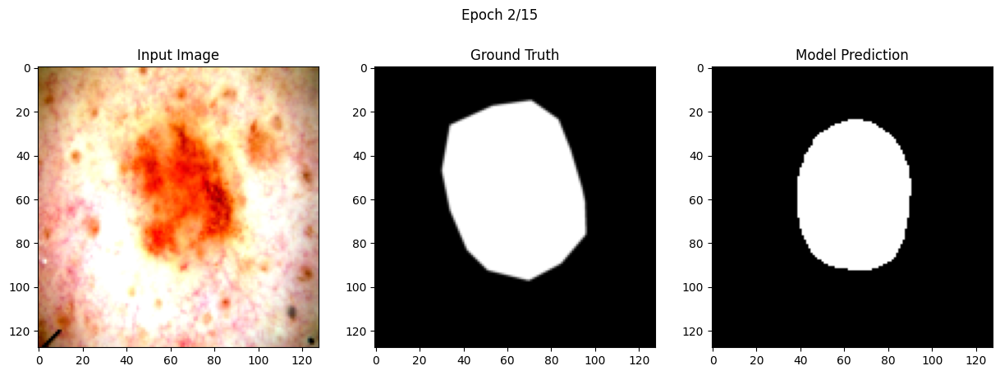

Epoch 3/15, Train Loss: 0.2772, Val Loss: 0.2824, Avg IoU: 0.7761, Avg Dice: 0.8200


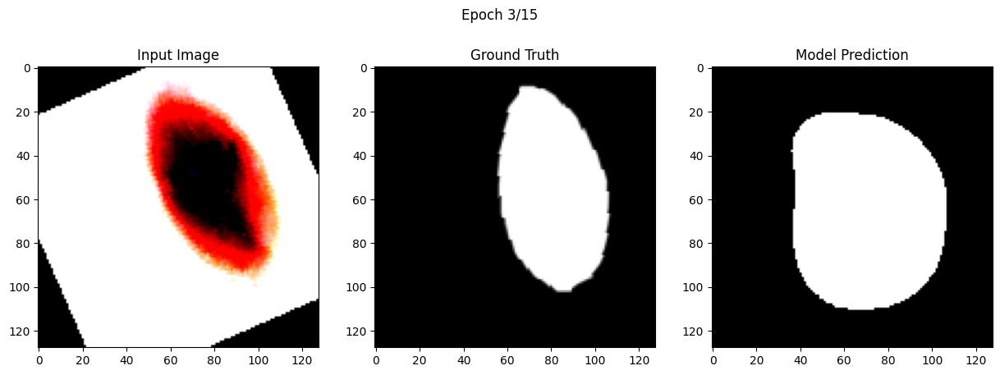

Epoch 4/15, Train Loss: 0.2654, Val Loss: 0.2893, Avg IoU: 0.7813, Avg Dice: 0.8212


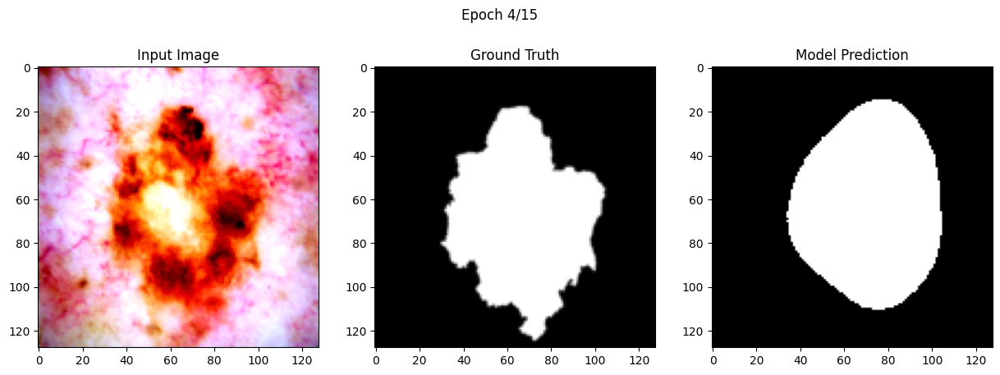

Epoch 5/15, Train Loss: 0.2610, Val Loss: 0.2739, Avg IoU: 0.7856, Avg Dice: 0.8274


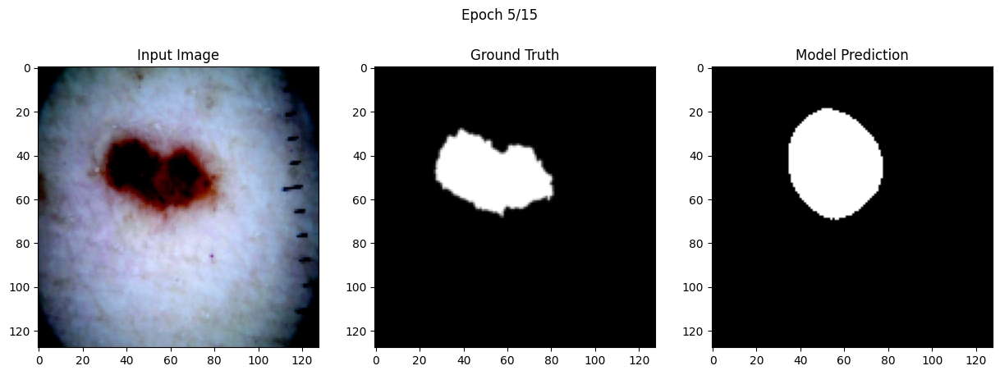

Epoch 6/15, Train Loss: 0.2557, Val Loss: 0.2696, Avg IoU: 0.7848, Avg Dice: 0.8269


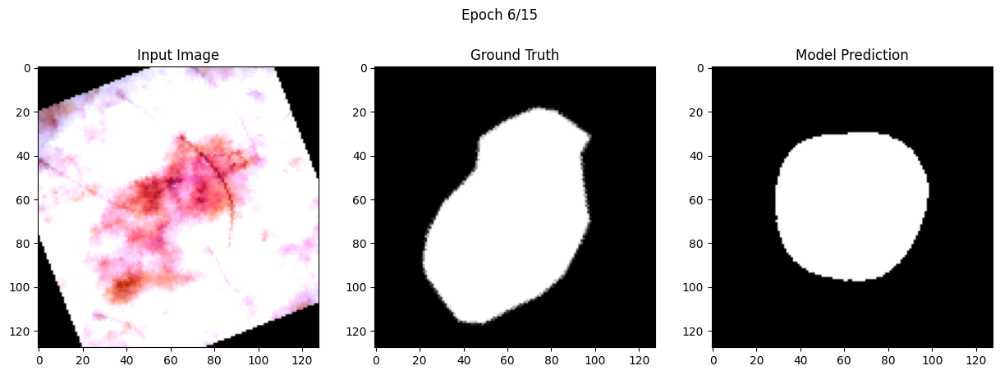

Epoch 7/15, Train Loss: 0.2434, Val Loss: 0.2677, Avg IoU: 0.7863, Avg Dice: 0.8290


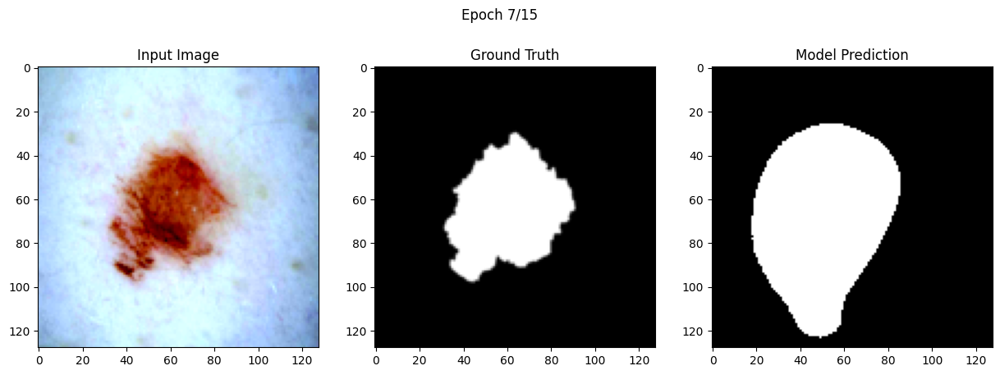

Epoch 8/15, Train Loss: 0.2308, Val Loss: 0.2646, Avg IoU: 0.7912, Avg Dice: 0.8306


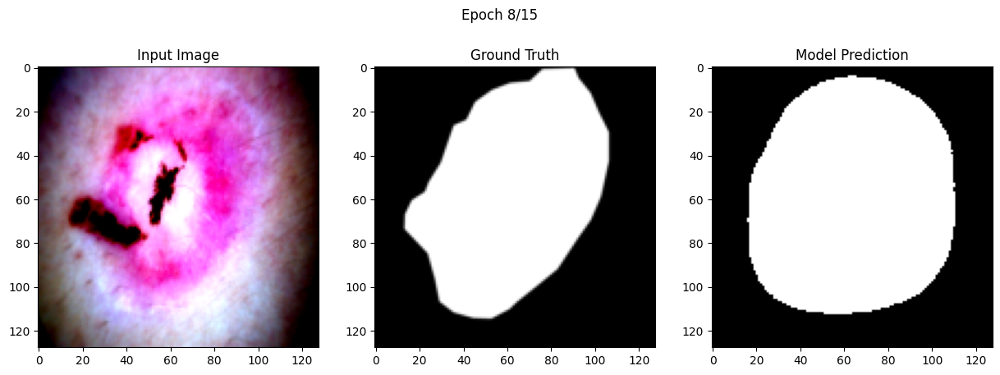

Epoch 9/15, Train Loss: 0.2303, Val Loss: 0.2616, Avg IoU: 0.7922, Avg Dice: 0.8311


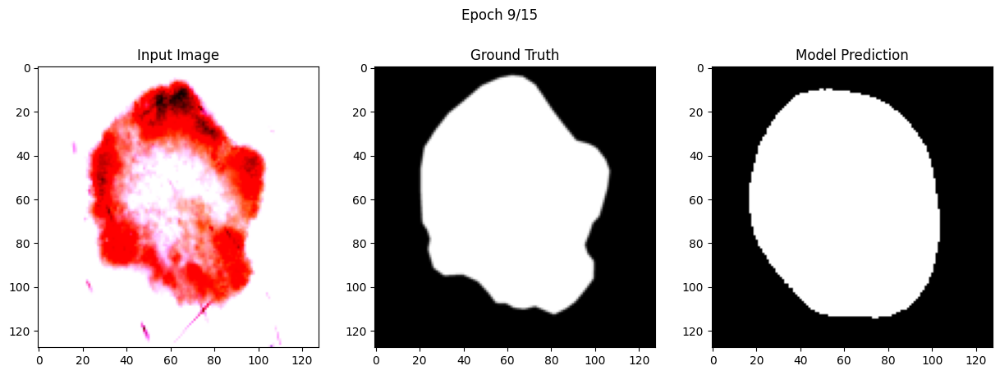

Epoch 10/15, Train Loss: 0.2234, Val Loss: 0.2735, Avg IoU: 0.7813, Avg Dice: 0.8214


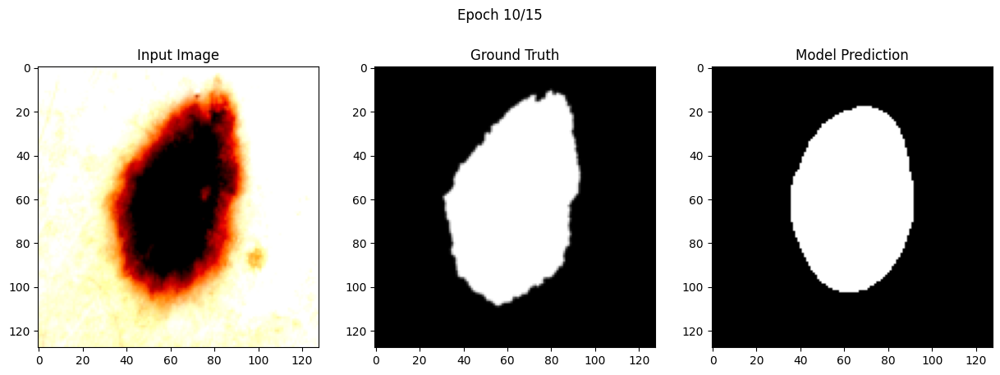

Epoch 11/15, Train Loss: 0.2144, Val Loss: 0.2597, Avg IoU: 0.7940, Avg Dice: 0.8334


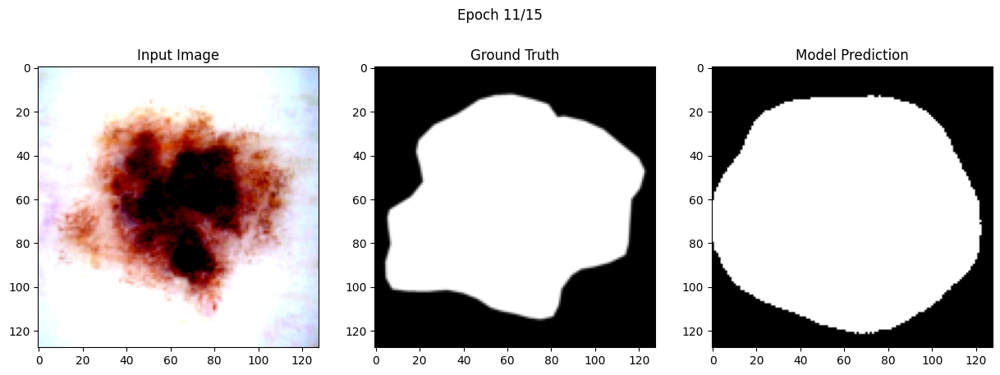

Epoch 12/15, Train Loss: 0.2094, Val Loss: 0.2630, Avg IoU: 0.7915, Avg Dice: 0.8315


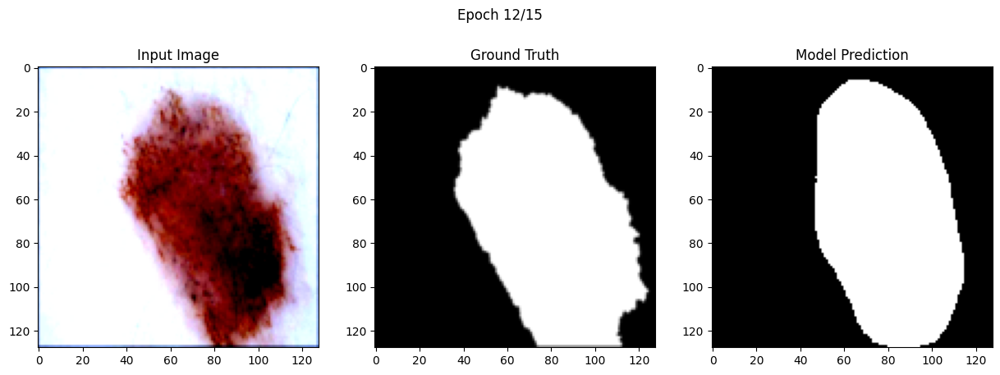

In [ ]:
mobilenet_v2_n = models.mobilenet_v2(pretrained=True).features
for param in mobilenet_v2_n.parameters():
    param.requires_grad = True


segnet_4 = SegNet(mobilenet_v2_n, decoder)


optimizer_4 = optim.Adam(segnet.parameters(), lr=0.005)


train_and_validate(segnet_4, criterion_2, optimizer_4, train_loader, val_loader, num_epochs=15)


test_model(segnet_4, criterion_2, test_loader)

In [ ]:
test_model(segnet_4, criterion_2, test_loader)

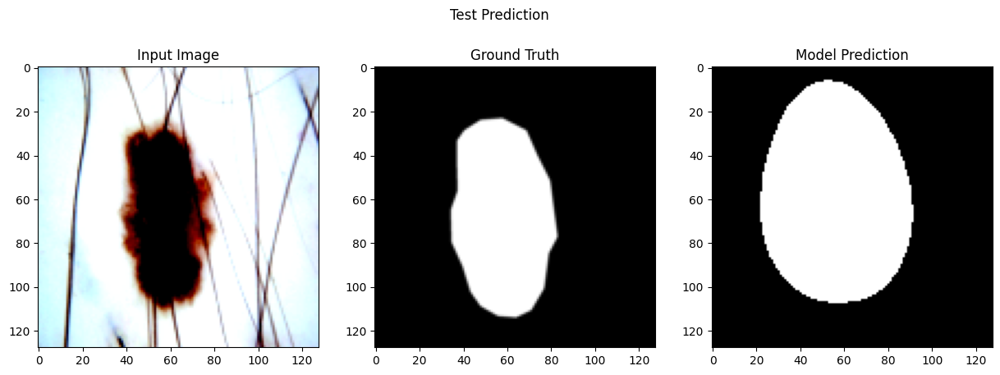

Test Loss: 0.2638, Avg IoU: 0.7585, Avg Dice: 0.8025


In [ ]:

test_model(segnet_4, criterion_2, test_loader)